In [1]:
#Package & Data Imports

In [145]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import OneHotEncoder,LabelEncoder
from sklearn.preprocessing import StandardScaler,MinMaxScaler,MaxAbsScaler
from sklearn.preprocessing import label_binarize

from sklearn.model_selection import train_test_split,StratifiedShuffleSplit
from sklearn.model_selection import KFold,cross_val_predict,GridSearchCV

from sklearn.linear_model import LogisticRegression,LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier
from sklearn.ensemble import VotingClassifier

from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,roc_auc_score
from sklearn.metrics import confusion_matrix,classification_report,roc_curve,precision_recall_curve
from sklearn.metrics import mean_squared_error

from io import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus

from colorsetup import colors, palette
sns.set_palette(palette)


In [3]:
#Read data
data_path = ['data']
file_path = os.sep.join(data_path + ['Ames_Housing_Sales.csv'])
data = pd.read_csv(file_path,sep=',')
data.shape

(1379, 80)

In [4]:
#Select Feature & Target Var's

In [5]:
data.columns[data.dtypes==np.object].tolist()

/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_59730/2474659249.py:1: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  data.columns[data.dtypes==np.object].tolist()


['Alley',
 'BldgType',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'BsmtQual',
 'CentralAir',
 'Condition1',
 'Condition2',
 'Electrical',
 'ExterCond',
 'ExterQual',
 'Exterior1st',
 'Exterior2nd',
 'Fence',
 'FireplaceQu',
 'Foundation',
 'Functional',
 'GarageCond',
 'GarageFinish',
 'GarageQual',
 'GarageType',
 'Heating',
 'HeatingQC',
 'HouseStyle',
 'KitchenQual',
 'LandContour',
 'LandSlope',
 'LotConfig',
 'LotShape',
 'MSZoning',
 'MasVnrType',
 'MiscFeature',
 'Neighborhood',
 'PavedDrive',
 'PoolQC',
 'RoofMatl',
 'RoofStyle',
 'SaleCondition',
 'SaleType',
 'Street',
 'Utilities']

In [6]:
data[['SalePrice','OverallCond','OverallQual']].describe()

,SalePrice,OverallCond,OverallQual
count,1379.00000,1379.000000,1379.000000
mean,185479.51124,5.577955,6.187092
std,79023.89060,1.081031,1.345780
min,35311.00000,2.000000,2.000000
25%,134000.00000,5.000000,5.000000
50%,167500.00000,5.000000,6.000000
75%,217750.00000,6.000000,7.000000
max,755000.00000,9.000000,10.000000


In [7]:
#data['OverallCond'].value_counts().to_frame()
data['OverallQual'].value_counts().to_frame()

,OverallQual
5,365
6,362
7,318
8,167
4,90
9,43
10,18
3,14
2,2


(array([  2.,  14.,  90., 365., 362., 318., 167.,  43.,  18.]),
 array([ 2.        ,  2.88888889,  3.77777778,  4.66666667,  5.55555556,
         6.44444444,  7.33333333,  8.22222222,  9.11111111, 10.        ]),
 <BarContainer object of 9 artists>)

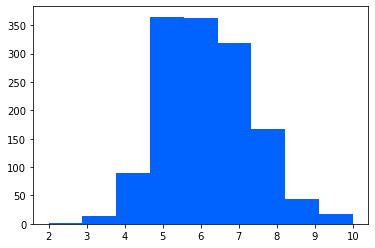

In [8]:
plt.hist(data['OverallQual'],bins=9)

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1379 entries, 0 to 1378
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   1stFlrSF       1379 non-null   float64
 1   2ndFlrSF       1379 non-null   float64
 2   3SsnPorch      1379 non-null   float64
 3   Alley          1379 non-null   object 
 4   BedroomAbvGr   1379 non-null   int64  
 5   BldgType       1379 non-null   object 
 6   BsmtCond       1379 non-null   object 
 7   BsmtExposure   1379 non-null   object 
 8   BsmtFinSF1     1379 non-null   float64
 9   BsmtFinSF2     1379 non-null   float64
 10  BsmtFinType1   1379 non-null   object 
 11  BsmtFinType2   1379 non-null   object 
 12  BsmtFullBath   1379 non-null   int64  
 13  BsmtHalfBath   1379 non-null   int64  
 14  BsmtQual       1379 non-null   object 
 15  BsmtUnfSF      1379 non-null   float64
 16  CentralAir     1379 non-null   object 
 17  Condition1     1379 non-null   object 
 18  Conditio

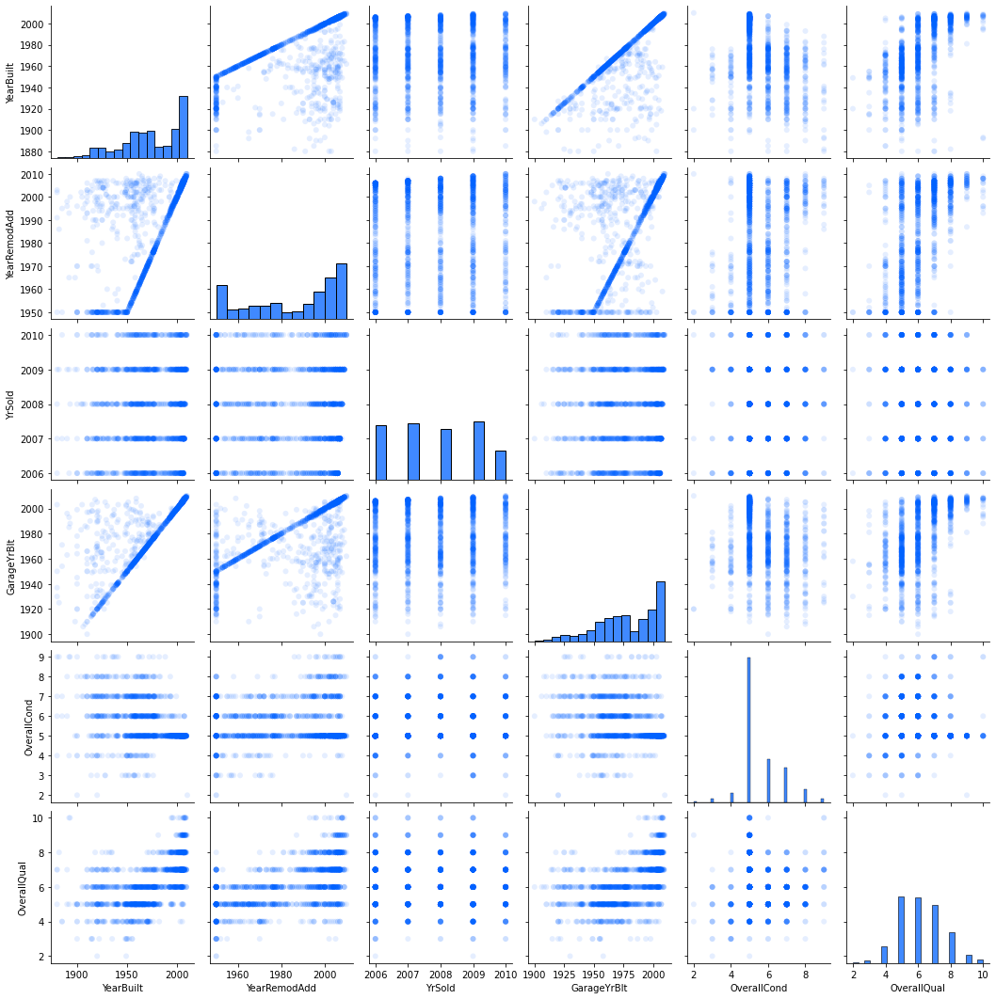

In [10]:
expdata = data.loc[:,['Neighborhood', 'HouseStyle',
                      'SaleCondition', 'SaleType',
                      'YearBuilt', 'YearRemodAdd', 'YrSold',
                      'BsmtCond', 'BsmtQual',
                      'ExterCond', 'ExterQual',
                      'GarageCond', 'GarageQual', 'GarageYrBlt',
                      'HeatingQC', 'KitchenQual', 'PoolQC',
                      'OverallCond', 'OverallQual']]

sns.pairplot(expdata, plot_kws=dict(alpha=0.1, edgecolor='none'))

In [11]:
expdata['PoolQC'].value_counts() #not applicable for most cases

None    1372
Gd         3
Ex         2
Fa         2
Name: PoolQC, dtype: int64

In [12]:
expdata['OverallQual'] = expdata['OverallQual'].replace([1,2,3,4],0).replace([5],1).replace([6],2).replace([7],3).replace([8,9,10],4).astype(np.int)
#expdata[['OverallQual','OverallQual2']].value_counts().sort_values()

/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_59730/4265120964.py:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  expdata['OverallQual'] = expdata['OverallQual'].replace([1,2,3,4],0).replace([5],1).replace([6],2).replace([7],3).replace([8,9,10],4).astype(np.int)


In [13]:
expdata.describe()

,YearBuilt,YearRemodAdd,YrSold,GarageYrBlt,OverallCond,OverallQual
count,1379.000000,1379.000000,1379.000000,1379.000000,1379.000000,1379.000000
mean,1972.958666,1985.435098,2007.812183,1978.506164,5.577955,2.142857
std,29.379883,20.444852,1.330221,24.689725,1.081031,1.201975
min,1880.000000,1950.000000,2006.000000,1900.000000,2.000000,0.000000
25%,1955.000000,1968.000000,2007.000000,1961.000000,5.000000,1.000000
50%,1976.000000,1994.000000,2008.000000,1980.000000,5.000000,2.000000
75%,2001.000000,2004.000000,2009.000000,2002.000000,6.000000,3.000000
max,2010.000000,2010.000000,2010.000000,2010.000000,9.000000,4.000000


In [14]:
#Feature Engineering

In [15]:
expdata.dtypes.value_counts()

object     13
int64       5
float64     1
dtype: int64

In [16]:
catg_cols = expdata.columns[expdata.dtypes==np.object]
num_cols = expdata.columns[expdata.dtypes!=np.object]

float_cols = expdata.columns[expdata.dtypes==np.float]
int_cols = expdata.columns[expdata.dtypes==np.int]

y_col = 'OverallQual'
catg_features = catg_cols
num_features = num_cols.drop(y_col)

/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_59730/584833425.py:1: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  catg_cols = expdata.columns[expdata.dtypes==np.object]
/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_59730/584833425.py:2: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  num_cols = expdata.columns[expdata.dtypes!=np.object]
/var/folders/jz/0vshmh6x6pbfhh1c0v8jvx8c0000gn/T/ipykernel_59730/584833425.py:4: DeprecationWarning: `np.float` is 

In [17]:
expdata[num_features].describe().T

,count,mean,std,min,25%,50%,75%,max
YearBuilt,1379.0,1972.958666,29.379883,1880.0,1955.0,1976.0,2001.0,2010.0
YearRemodAdd,1379.0,1985.435098,20.444852,1950.0,1968.0,1994.0,2004.0,2010.0
YrSold,1379.0,2007.812183,1.330221,2006.0,2007.0,2008.0,2009.0,2010.0
GarageYrBlt,1379.0,1978.506164,24.689725,1900.0,1961.0,1980.0,2002.0,2010.0
OverallCond,1379.0,5.577955,1.081031,2.0,5.0,5.0,6.0,9.0


In [18]:
expdata[catg_features].astype('category').describe().T

,count,unique,top,freq
Neighborhood,1379,25,NAmes,219
HouseStyle,1379,8,1Story,686
SaleCondition,1379,6,Normal,1137
SaleType,1379,9,WD,1194
BsmtCond,1379,4,TA,889
BsmtQual,1379,5,TA,442
ExterCond,1379,4,TA,1221
ExterQual,1379,4,TA,833
GarageCond,1379,5,TA,1326
GarageQual,1379,5,TA,1311


In [19]:
expdata[y_col].describe()

count    1379.000000
mean        2.142857
std         1.201975
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
max         4.000000
Name: OverallQual, dtype: float64

In [20]:
expdata[y_col].astype('category').describe()

count     1379
unique       5
top          1
freq       365
Name: OverallQual, dtype: int64

In [21]:
#Skew Transformation
skew_limit = 0.75
skew_vals = expdata[num_cols].skew()

skew_cols = (skew_vals.sort_values(ascending=False)
                      .to_frame()
                      .rename(columns={0:'Skew'})
                      .query('abs(Skew) > {0}'.format(skew_limit)))

skew_cols

,Skew
OverallCond,0.866698


0.16523524864667813

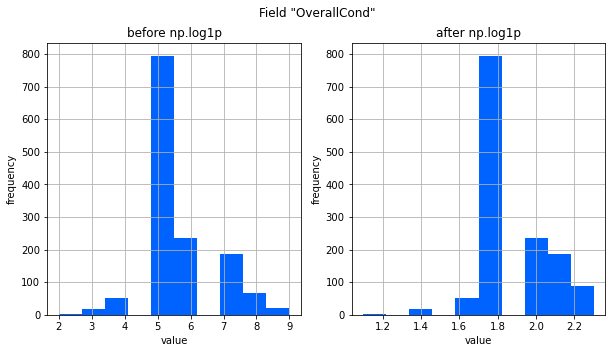

In [22]:
#Visualize skew transformation
field = 'OverallCond'
fig, (ax_before, ax_after) = plt.subplots(1,2,figsize=(10,5))
expdata['OverallCond'].hist(ax=ax_before)
expdata['OverallCond'].apply(np.log1p).hist(ax=ax_after)

ax_before.set(title='before np.log1p',ylabel='frequency',xlabel='value')
ax_after.set(title='after np.log1p',ylabel='frequency',xlabel='value')
fig.suptitle('Field "{}"'.format(field))

expdata['OverallCond'] = expdata['OverallCond'].apply(np.log1p)
expdata['OverallCond'].skew()

In [23]:
#Encoding Categorical Var's
catg_cols_ohc = (expdata[catg_features]
                 .apply(lambda x: x.nunique())
                 .sort_values(ascending=False))
catg_cols_ohc#.sum() #88 total

Neighborhood     25
SaleType          9
HouseStyle        8
SaleCondition     6
BsmtQual          5
GarageCond        5
GarageQual        5
HeatingQC         5
BsmtCond          4
ExterCond         4
ExterQual         4
KitchenQual       4
PoolQC            4
dtype: int64

In [24]:
#out of 18 vars, 13 categorical encoded into 88-13=75, plus 5 numeric gives 80 vars post-ohc
expdata_ohc = expdata.copy()
expdata_ohc = pd.get_dummies(expdata_ohc,columns=catg_features,drop_first=True)
expdata_ohc.describe().T

,count,mean,std,min,25%,50%,75%,max
YearBuilt,1379.0,1972.958666,29.379883,1880.000000,1955.000000,1976.000000,2001.00000,2010.000000
YearRemodAdd,1379.0,1985.435098,20.444852,1950.000000,1968.000000,1994.000000,2004.00000,2010.000000
YrSold,1379.0,2007.812183,1.330221,2006.000000,2007.000000,2008.000000,2009.00000,2010.000000
GarageYrBlt,1379.0,1978.506164,24.689725,1900.000000,1961.000000,1980.000000,2002.00000,2010.000000
OverallCond,1379.0,1.870829,0.159701,1.098612,1.791759,1.791759,1.94591,2.302585
...,...,...,...,...,...,...,...,...
KitchenQual_Gd,1379.0,0.421320,0.493950,0.000000,0.000000,0.000000,1.00000,1.000000
KitchenQual_TA,1379.0,0.490210,0.500086,0.000000,0.000000,0.000000,1.00000,1.000000
PoolQC_Fa,1379.0,0.001450,0.038069,0.000000,0.000000,0.000000,0.00000,1.000000
PoolQC_Gd,1379.0,0.002175,0.046608,0.000000,0.000000,0.000000,0.00000,1.000000


In [25]:
#Pairwise Correlation among Features

In [26]:
#calcualte correlation values between each pair of features
feature_cols = expdata_ohc.columns.drop(y_col)
corr_vals = expdata_ohc[feature_cols].corr()

#simplify by removing data below diagonal
tril_index = np.tril_indices_from(corr_vals) 

#fill NaNs below diagonal
for coord in zip(*tril_index):
    corr_vals.iloc[coord[0],coord[1]] = np.NaN
    
#stack data and convert to data frame
corr_vals = (corr_vals.stack()
                      .to_frame() #compact format
                      .reset_index()
                      .rename(columns={'level_0':'Feature 1',
                                       'level_1':'Feature 2',
                                       0:'Correlation'})) #table format with duplicate labels

#add absolute values for sorting
corr_vals['abs_Correlation'] = corr_vals['Correlation'].abs()
corr_vals

,Feature 1,Feature 2,Correlation,abs_Correlation
0,YearBuilt,YearRemodAdd,0.618058,0.618058
1,YearBuilt,YrSold,-0.006809,0.006809
2,YearBuilt,GarageYrBlt,0.825667,0.825667
3,YearBuilt,OverallCond,-0.363103,0.363103
4,YearBuilt,Neighborhood_Blueste,0.009137,0.009137
...,...,...,...,...
3155,KitchenQual_TA,PoolQC_Gd,-0.014653,0.014653
3156,KitchenQual_TA,PoolQC_None,0.049631,0.049631
3157,PoolQC_Fa,PoolQC_Gd,-0.001780,0.001780
3158,PoolQC_Fa,PoolQC_None,-0.533551,0.533551


[Text(0.5, 0, 'Absolute Correlation'), Text(0, 0.5, 'Frequency')]

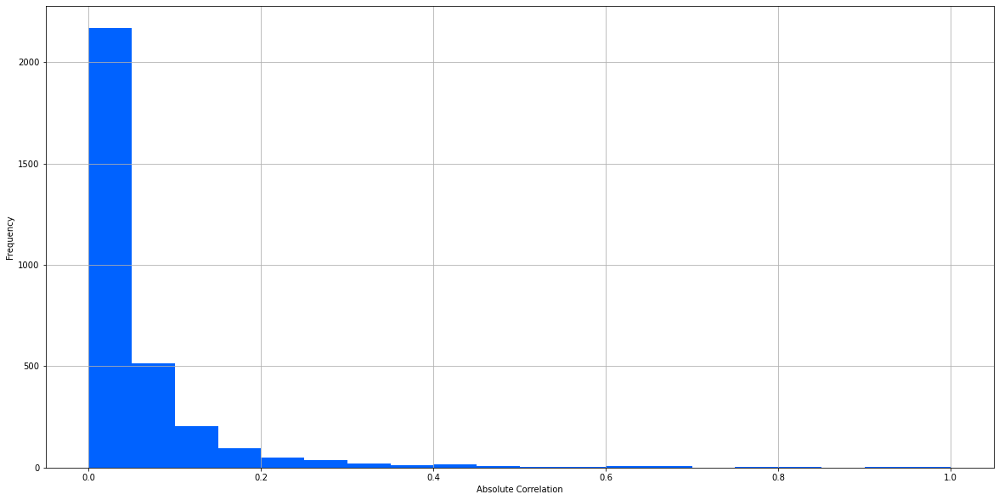

In [27]:
ax = corr_vals['abs_Correlation'].hist(bins=20,figsize=(20,10))
ax.set(xlabel='Absolute Correlation',ylabel='Frequency')

In [28]:
#the most highly correlated features
corr_vals.sort_values('Correlation',ascending=False).query('abs_Correlation>0.8')

#BsmtCond == BsmtQual, whenever either is "None"
#"New" SaleType almost always comes with a "Partial" SaleCondition
#Garage most likely built in same year Property was built

,Feature 1,Feature 2,Correlation,abs_Correlation
2728,BsmtCond_None,BsmtQual_None,1.000000,1.000000
2385,SaleCondition_Partial,SaleType_New,0.986552,0.986552
2,YearBuilt,GarageYrBlt,0.825667,0.825667
3009,GarageCond_Fa,GarageCond_TA,-0.807176,0.807176
3071,GarageQual_Fa,GarageQual_TA,-0.833832,0.833832
3150,KitchenQual_Gd,KitchenQual_TA,-0.836724,0.836724
2725,BsmtCond_None,BsmtCond_TA,-0.900557,0.900557
2756,BsmtCond_TA,BsmtQual_None,-0.900557,0.900557
2970,ExterQual_Gd,ExterQual_TA,-0.912658,0.912658
2907,ExterCond_Gd,ExterCond_TA,-0.927007,0.927007


In [29]:
#Stratified Train-Test Splits

In [30]:
y_col = 'OverallQual'

modeldata = expdata_ohc.drop(['GarageYrBlt'],axis=1) #GarageYrBlt can be represented by YearBuilt

X_modeldata = modeldata.drop(y_col,axis=1)
y_modeldata = modeldata[y_col]

#X_train,X_test,y_train,y_test = train_test_split(X_modeldata,,y_modeldata,test_size=0.3,random_state=416)

stratified_split = StratifiedShuffleSplit(n_splits=1,test_size=0.3,random_state=416)
train_idx, test_idx = next(stratified_split.split(X_modeldata,y_modeldata))

X_train = X_modeldata.loc[train_idx]
y_train = y_modeldata.loc[train_idx]

X_test = X_modeldata.loc[test_idx]
y_test = y_modeldata.loc[test_idx]

#Feature Scaling
stdscaler = StandardScaler()
X_train_scal = stdscaler.fit_transform(X_train)
X_test_scal = stdscaler.transform(X_test)

In [31]:
y_train.value_counts(normalize=True)

1    0.264249
2    0.262176
3    0.231088
4    0.165803
0    0.076684
Name: OverallQual, dtype: float64

In [32]:
y_test.value_counts(normalize=True)

1    0.265700
2    0.263285
3    0.229469
4    0.164251
0    0.077295
Name: OverallQual, dtype: float64

In [33]:
#Logistic Regression Models

In [34]:
#standard Logistic Regression
#LogisticR_unscal_model = LogisticRegression(solver='liblinear').fit(X_train,y_train)
LogisticR_model = LogisticRegression(solver='liblinear').fit(X_train_scal,y_train)

#L1/L2 regularized Logistic Regression
LogisticR_L1_model = LogisticRegressionCV(Cs=10,cv=3,penalty='l1',solver='liblinear',max_iter=100).fit(X_train_scal,y_train)
LogisticR_L2_model = LogisticRegressionCV(Cs=10,cv=3,penalty='l2',solver='liblinear',max_iter=100).fit(X_train_scal,y_train)

#liblinear supports one-versus-all for multi-class Logistic Regression

/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_b

In [35]:
#Logistic Regression Model Comparison
coef_labels = ['Logistic Regression - Standard',
               'Logistic Regression - L1 Regularized',
               'Logistic Regression - L2 Regularized']

coef_models = [LogisticR_model,
               LogisticR_L1_model,
               LogisticR_L2_model]

In [36]:
#compare magnitudes of feature coefficients for each class (1-5) assignment across models
coef_list = list()

for label,model in zip(coef_labels,coef_models):
    coefs = model.coef_
    coef_label = pd.MultiIndex(levels=[[label],[0,1,2,3,4]],
                               codes=[[0,0,0,0,0],[0,1,2,3,4]]) #designate each level at specific location
    coef_list.append(pd.DataFrame(coefs.T, columns=coef_label))
                     
coef_list = pd.concat(coef_list,axis=1)
coef_list.sample(10)

Logistic Regression - Standard                                          \
                                0         1         2         3         4   
28                      -0.207937  0.025488  0.056943 -0.215596 -0.054607   
39                      -0.184922  0.373382 -0.217572  0.011299 -0.266012   
42                      -0.089552  0.092765 -0.203492  0.121404 -0.093115   
66                      -0.006954 -0.210585  0.084155 -0.034193  0.119290   
75                       0.314349  0.319655  0.806470  0.119779 -1.454005   
16                      -0.115114 -0.275638  0.531875 -0.374447 -0.023233   
15                       0.127730  0.239015  0.453024 -0.622032  0.203233   
50                       0.015852  0.303312 -0.459256  0.420417  0.131589   
1                       -0.167503  0.158265 -0.012792  0.046312  0.446044   
78                      -0.018007  0.117023 -0.035068  0.112397 -0.077198   

   Logistic Regression - L1 Regularized                                     \
                                      0         1         2    3         4   
28                                  0.0  0.017022  0.000000  0.0  0.000000   
39                                  0.0  0.000000  0.000000  0.0 -0.295472   
42                                  0.0  0.070374  0.000000  0.0 -0.045897   
66                                  0.0 -0.076651  0.000000  0.0  0.040885   
75                                  0.0  0.206429  0.001196  0.0 -1.794620   
16                                  0.0 -0.129070  0.138333  0.0  0.000000   
15                                  0.0  0.198811  0.002064  0.0  0.293427   
50                                  0.0  0.000000  0.000000  0.0  0.000000   
1                                   0.0  0.021468  0.000000  0.0  0.522311   
78                                  0.0  0.068076  0.000000  0.0  0.000000   

   Logistic Regression - L2 Regularized                                \
                                      0         1         2         3   
28                            -0.076216  0.036515  0.048687 -0.029795   
39                            -0.024010 -0.016919 -0.051366  0.020979   
42                            -0.059311  0.071519 -0.073724  0.021348   
66                             0.007176 -0.074108  0.020715 -0.001595   
75                             0.056045  0.189627  0.219699 -0.067800   
16                            -0.041754 -0.130004  0.271675 -0.037778   
15                            -0.025715  0.128089  0.104607 -0.060854   
50                            -0.021422  0.056686 -0.069413 -0.039568   
1                             -0.117743  0.033404 -0.018089  0.048437   
78                             0.004803  0.051807 -0.015938  0.015165   

              
           4  
28 -0.037286  
39 -0.205587  
42 -0.073625  
66  0.097549  
75 -1.130667  
16 -0.022286  
15  0.050581  
50  0.102351  
1   0.350785  
78 -0.067387

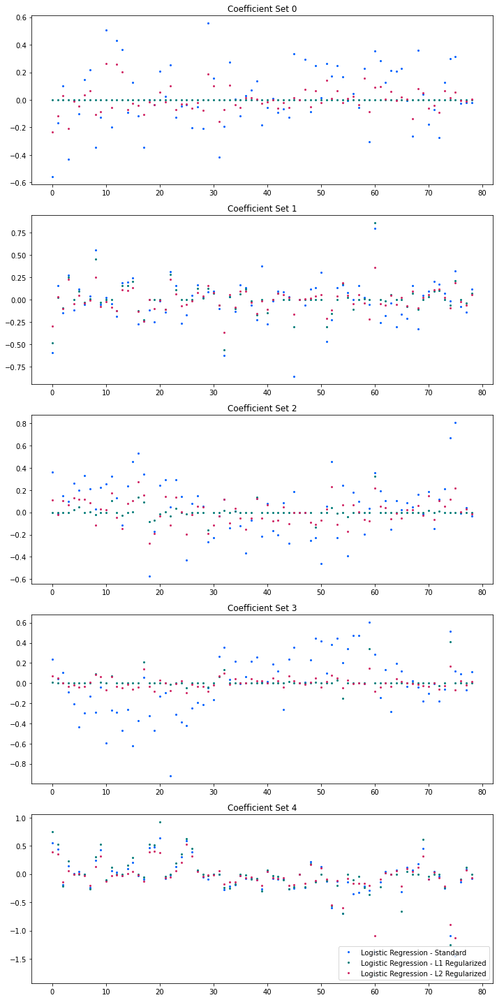

In [37]:
#Plot Coefficient Sets
fig, axList = plt.subplots(nrows=5,ncols=1)
axList = axList.flatten()
fig.set_size_inches(10,20)

for ax in enumerate(axList):
    loc = ax[0]
    ax = ax[1]
    
    data = coef_list.xs(loc,level=1,axis=1)
    data.plot(marker='o', ls='', ms=2.0, ax=ax, legend=False)
    
    if ax is axList[-1]:
        ax.legend(loc=4)
    
    ax.set(title='Coefficient Set ' + str(loc))
    
plt.tight_layout()


In [38]:
#predict the class and the prob for each
y_pred = list()
y_prob = list()

for label,model in zip(coef_labels,coef_models):
    y_pred.append(pd.Series(model.predict(X_test_scal), name=label))
    y_prob.append(pd.Series(model.predict_proba(X_test_scal).max(axis=1), name=label))
    
y_pred = pd.concat(y_pred, axis=1)
y_prob = pd.concat(y_prob, axis=1)

y_pred.head(10)

,Logistic Regression - Standard,Logistic Regression - L1 Regularized,Logistic Regression - L2 Regularized
0,1,1,1
1,3,0,3
2,1,1,1
3,1,1,1
4,2,0,2
5,3,0,3
6,4,4,4
7,1,1,1
8,1,1,1
9,1,0,1


In [39]:
y_prob.head(10)

,Logistic Regression - Standard,Logistic Regression - L1 Regularized,Logistic Regression - L2 Regularized
0,0.720773,0.417088,0.516131
1,0.511576,0.330242,0.495842
2,0.622899,0.448579,0.531319
3,0.640306,0.345845,0.452397
4,0.596548,0.383616,0.459877
5,0.557101,0.347778,0.512045
6,0.656481,0.449545,0.477899
7,0.713687,0.475012,0.570533
8,0.576418,0.391849,0.466976
9,0.496229,0.339719,0.407807


In [40]:
#Confusion Matrix & Error Metrics
metrics = list()
conf_matrix = dict()

for label in coef_labels:
    precision, recall, fscore, _ = score(y_test, y_pred[label], average='weighted')
    
    accuracy = accuracy_score(y_test, y_pred[label])
    
    roc_auc = roc_auc_score(label_binarize(y_test, classes=[0,1,2,3,4]),
                            label_binarize(y_pred[label], classes=[0,1,2,3,4]),
                            average='weighted')
    
    conf_matrix[label] = confusion_matrix(y_test, y_pred[label])
    
    metrics.append(pd.Series({'Accuracy':accuracy,
                              'Precision':precision,
                              'Recall':recall,
                              'Fscore':fscore,
                              'ROC AUC':roc_auc},
                              name = label))
    
metrics = pd.concat(metrics, axis=1)
metrics

,Logistic Regression - Standard,Logistic Regression - L1 Regularized,Logistic Regression - L2 Regularized
Accuracy,0.555556,0.369565,0.531401
Precision,0.548878,0.595808,0.531146
Recall,0.555556,0.369565,0.531401
Fscore,0.545694,0.394818,0.517051
ROC AUC,0.708105,0.636695,0.691673


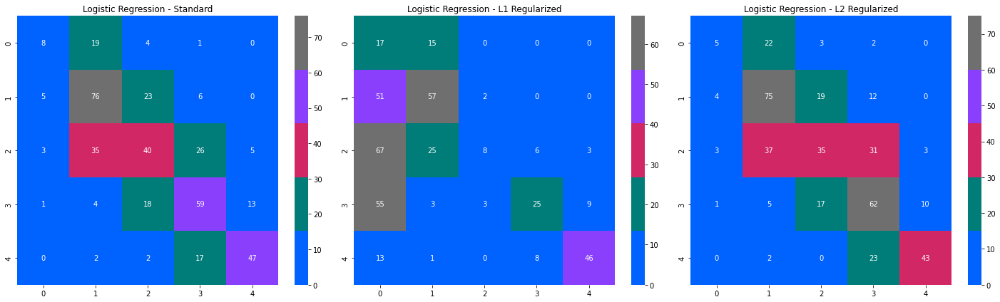

In [41]:
#Display Confusion Matrix for Each Model
fig, axList = plt.subplots(nrows=1, ncols=3)
axList = axList.flatten()
fig.set_size_inches(20,6)

for ax, label in zip(axList, coef_labels):
    sns.heatmap(conf_matrix[label], ax=ax, annot=True, fmt='d', cmap=colors)
    ax.set(title=label)

plt.tight_layout()


In [42]:
#K-Nearest Neighbors

In [43]:
#Hyperparameter tunning: best K=12 for KNN
min_k = 1
max_k = 30
f1_list = list()
error_list = list() #1-accuracy

for k in range(min_k,max_k):
    KNN_model = KNeighborsClassifier(n_neighbors=k, weights='distance')
    KNN_model = KNN_model.fit(X_train_scal, y_train)
    
    y_pred = KNN_model.predict(X_test)
    f1 = round(f1_score(y_pred, y_test, average='weighted'), 4)
    f1_list.append((k, f1))
    error = 1 - round(accuracy_score(y_test, y_pred), 4)
    error_list.append((k, error))
    
f1_results = pd.DataFrame(f1_list, columns=['K', 'F1 Score'])
error_results = pd.DataFrame(error_list, columns=['K', 'Error Rate'])

Text(0.5, 1.0, 'KNN F1 Score')

<Figure size 1800x1200 with 0 Axes>

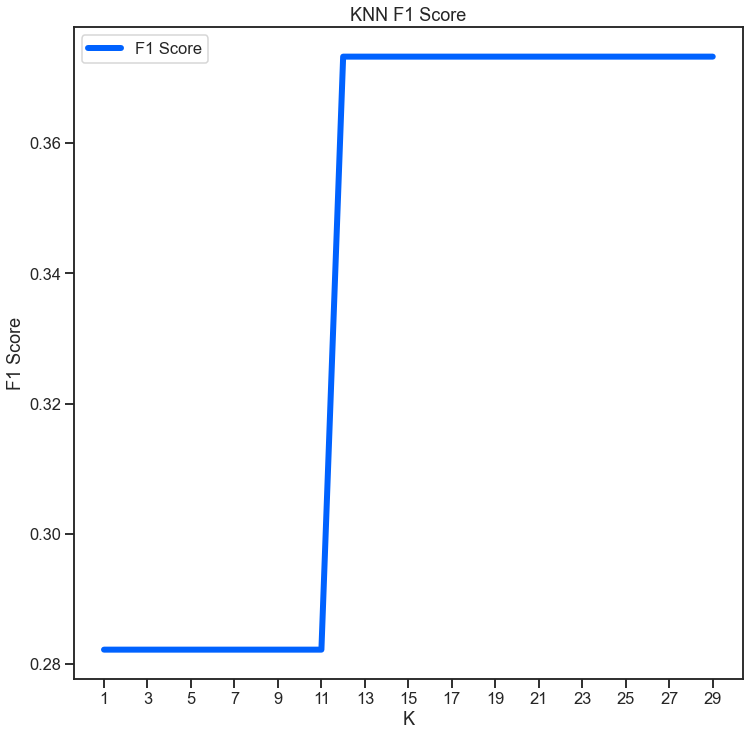

In [44]:
#plot F1 results
sns.set_context('talk')
sns.set_style('ticks')

plt.figure(dpi=300)
ax = f1_results.set_index('K').plot(color=colors[0], figsize=(12,12), linewidth=6)
ax.set(xlabel='K', ylabel='F1 Score')
ax.set_xticks(range(min_k,max_k,2))
plt.title('KNN F1 Score')

Text(0.5, 1.0, 'KNN Error Rate')

<Figure size 1800x1200 with 0 Axes>

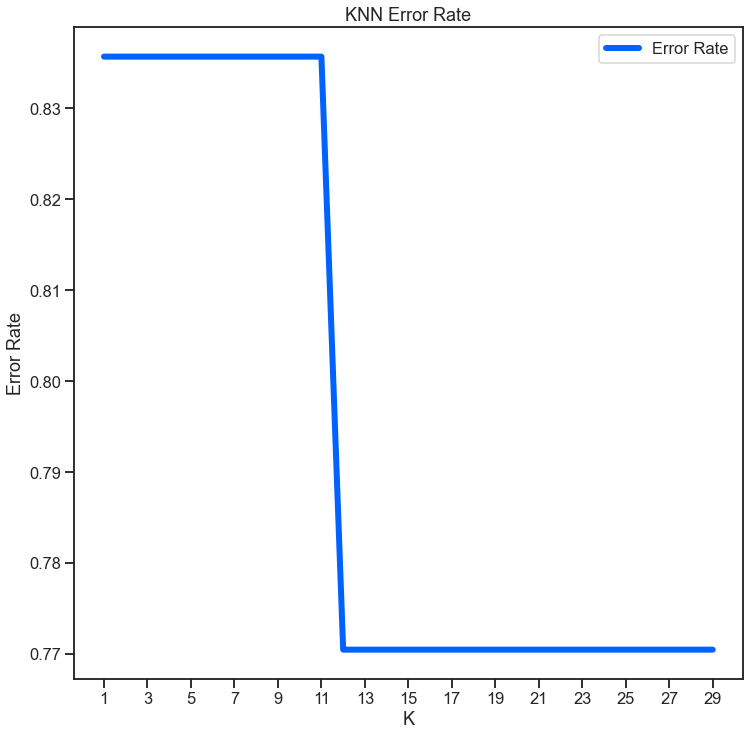

In [45]:
#plot Accuracy (Error Rate) results
sns.set_context('talk')
sns.set_style('ticks')

plt.figure(dpi=300)
ax = error_results.set_index('K').plot(color=colors[0], figsize=(12,12), linewidth=6)
ax.set(xlabel='K', ylabel='Error Rate')
ax.set_xticks(range(min_k, max_k, 2))
plt.title('KNN Error Rate')

In [46]:
KNN_model = KNeighborsClassifier(n_neighbors=12).fit(X_train_scal,y_train)
y_pred = KNN_model.predict(X_test_scal)

print(classification_report(y_test, y_pred))
print('Accuracy score: ', round(accuracy_score(y_test, y_pred),2))
print('F1 Score: ', round(f1_score(y_test, y_pred, average='weighted'),2))

              precision    recall  f1-score   support

           0       0.39      0.22      0.28        32
           1       0.54      0.72      0.62       110
           2       0.49      0.42      0.46       109
           3       0.52      0.56      0.54        95
           4       0.71      0.59      0.65        68

    accuracy                           0.54       414
   macro avg       0.53      0.50      0.51       414
weighted avg       0.54      0.54      0.54       414

Accuracy score:  0.54
F1 Score:  0.54


In [47]:
#Support Vector Machines

In [48]:
correlations = modeldata[modeldata.columns.drop(y_col)].corrwith(modeldata[y_col])
correlations = correlations.sort_values()
correlations 

#highest predictive power: ExterQual_TA, KitchenQual_TA, YearBuilt, YearRemodAdd

ExterQual_TA           -0.688617
KitchenQual_TA         -0.597090
BsmtQual_TA            -0.436009
HeatingQC_TA           -0.366263
Neighborhood_NAmes     -0.267973
                          ...   
Neighborhood_NridgHt    0.323308
KitchenQual_Gd          0.452246
YearRemodAdd            0.564189
YearBuilt               0.584416
ExterQual_Gd            0.605395
Length: 79, dtype: float64

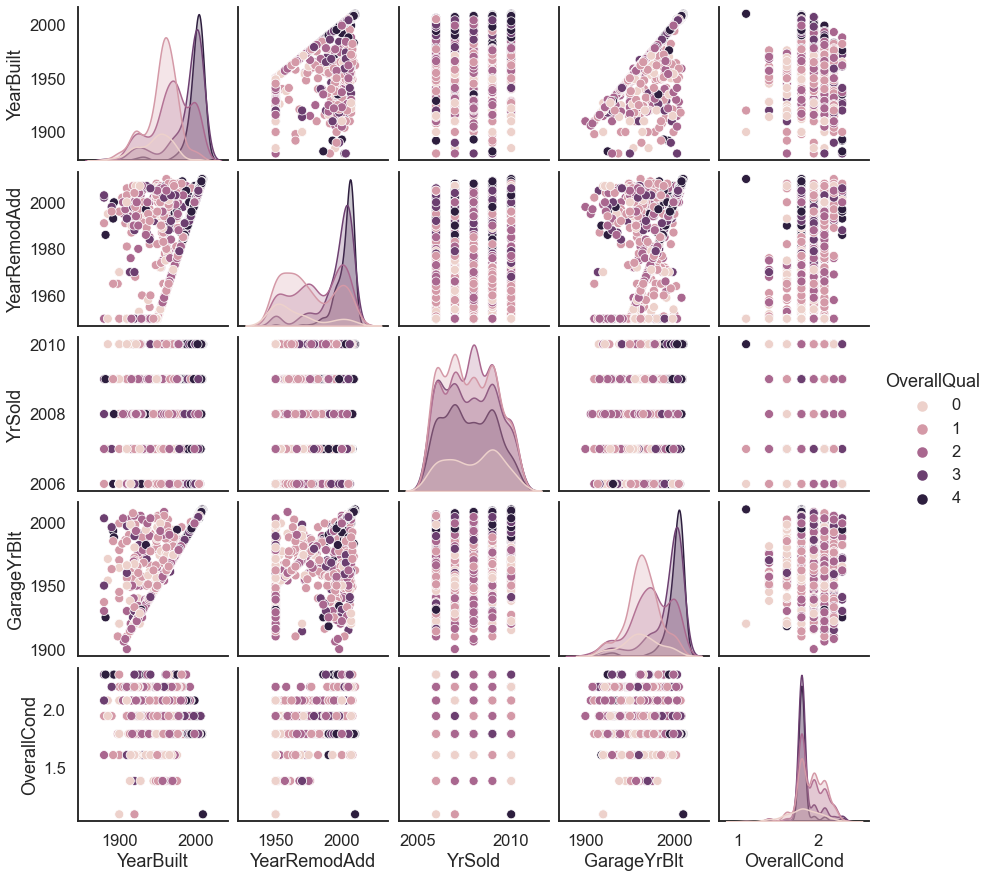

In [49]:
sns.set_context('talk')
sns.set_palette(palette)
sns.set_style('white')
sns.pairplot(expdata, hue='OverallQual')

[(-1.0, 1.0), Text(0, 0.5, 'pearson correlation')]

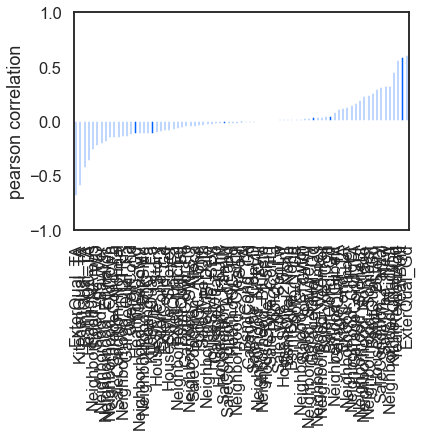

In [50]:
ax = correlations.plot(kind='bar', color=colors[0])
ax.set(ylim=[-1,1], ylabel='pearson correlation')

In [51]:
#Linear Support Vector Classifier - 2 Dimensional
fields = ['YearBuilt','YearRemodAdd']
X_LSVCdata = X_modeldata[fields]
y_LSVCdata = y_modeldata

stratified_split = StratifiedShuffleSplit(n_splits=1,test_size=0.3,random_state=416)
train_idx, test_idx = next(stratified_split.split(X_LSVCdata,y_LSVCdata))

X_train_LSVC = X_LSVCdata.loc[train_idx]
y_train_LSVC = y_LSVCdata.loc[train_idx]

X_test_LSVC = X_LSVCdata.loc[test_idx]
y_test_LSVC = y_LSVCdata.loc[test_idx]

#Feature Scaling
minmaxscaler = MinMaxScaler()
X_train_scal_LSVC = minmaxscaler.fit_transform(X_train_LSVC)
X_test_scal_LSVC = minmaxscaler.transform(X_test_LSVC)

X_train_scal_LSVC = pd.DataFrame(X_train_scal_LSVC, columns=['%s_scaled' % field for field in ['YearBuilt','YearRemodAdd']])
X_test_scal_LSVC = pd.DataFrame(X_test_scal_LSVC, columns=['%s_scaled' % field for field in ['YearBuilt','YearRemodAdd']])

[Text(0.5, 0, 'YearBuilt'),
 Text(0, 0.5, 'YearRemodAdd'),
 (0.0, 1.0),
 (0.0, 1.0),
 Text(0.5, 1.0, 'Decision Boundary for LinearSVC_model')]

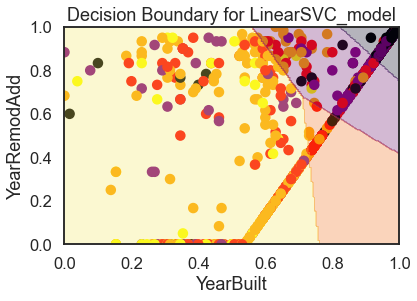

In [52]:
LinearSVC_model = LinearSVC().fit(X_train_scal_LSVC, y_train_LSVC)

X_color = X_train_scal_LSVC
y_color = y_train_LSVC
y_color = y_color.map(lambda r: 'yellow' if r==0 
                             else ('orange' if r==1
                             else ('red' if r==2
                             else ('purple' if r==3
                             else 'black'))))

#plot true classes
ax=plt.axes()
ax.scatter(X_color.iloc[:,0], X_color.iloc[:,1], color=y_color, alpha=1)

#plot decision boundary
x_axis, y_axis = np.arange(0,1.005,0.005), np.arange(0,1.005,0.005)
xx, yy = np.meshgrid(x_axis, y_axis)
xx_ravel = xx.ravel()
yy_ravel = yy.ravel()
X_grid = pd.DataFrame([xx_ravel, yy_ravel]).T
y_grid_predictions = LinearSVC_model.predict(X_grid)
y_grid_predictions = y_grid_predictions.reshape(xx.shape)
ax.contourf(xx, yy, y_grid_predictions, cmap=plt.cm.inferno_r, alpha=.3)

ax.set(xlabel=fields[0], ylabel=fields[1],
       xlim=[0,1], ylim=[0,1], title='Decision Boundary for LinearSVC_model')


In [53]:
#Gaussian Kernel Support Vector Classifier
def plot_decision_boundary(estimator, X, y):
    estimator.fit(X, y)
    X_color = X
    y_color = y.map(lambda r: 'yellow' if r==0 
                             else ('orange' if r==1
                             else ('red' if r==2
                             else ('purple' if r==3
                             else 'black'))))
    
    x_axis, y_axis = np.arange(0,1,0.005), np.arange(0,1,0.005)
    xx, yy = np.meshgrid(x_axis, y_axis)
    xx_ravel = xx.ravel()
    yy_ravel = yy.ravel()
    X_grid = pd.DataFrame([xx_ravel, yy_ravel]).T
    y_grid_predictions = estimator.predict(X_grid)
    y_grid_predictions = y_grid_predictions.reshape(xx.shape)
    
    fig, ax = plt.subplots(figsize=(10,10))
    ax.contourf(xx, yy, y_grid_predictions, cmap=plt.cm.inferno_r, alpha=.3)
    ax.scatter(X_color.iloc[:,0], X_color.iloc[:,1], color=y_color, alpha=1)
    
    ax.set(xlabel=fields[0], ylabel=fields[1], title=str(estimator))

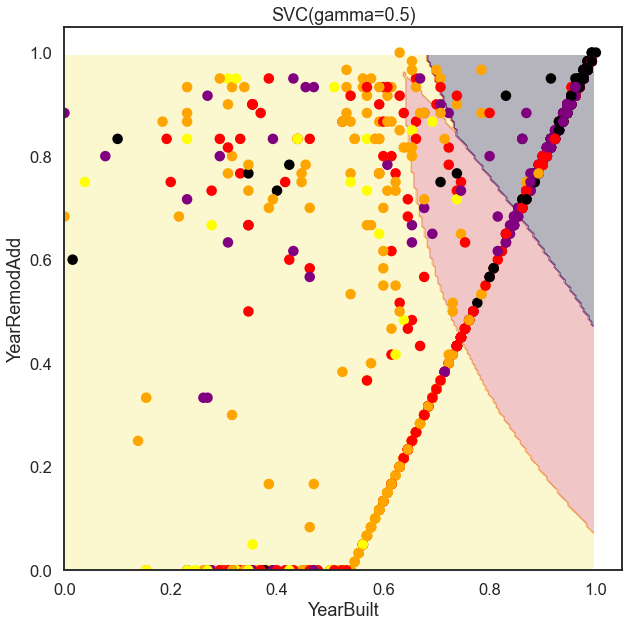

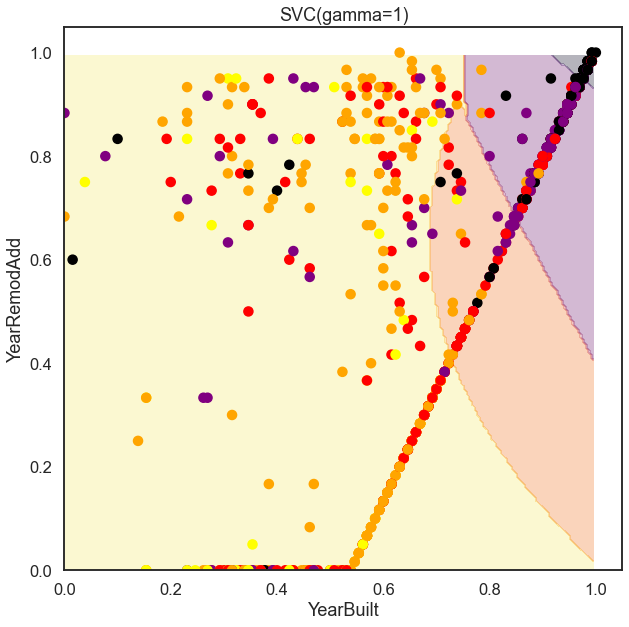

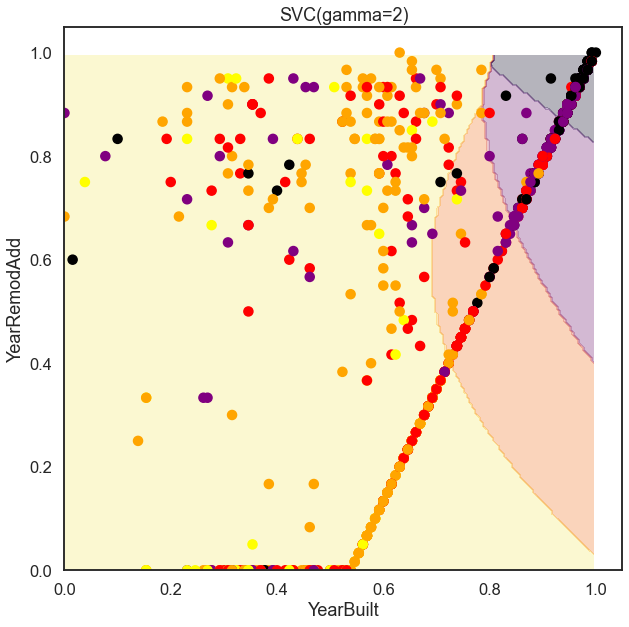

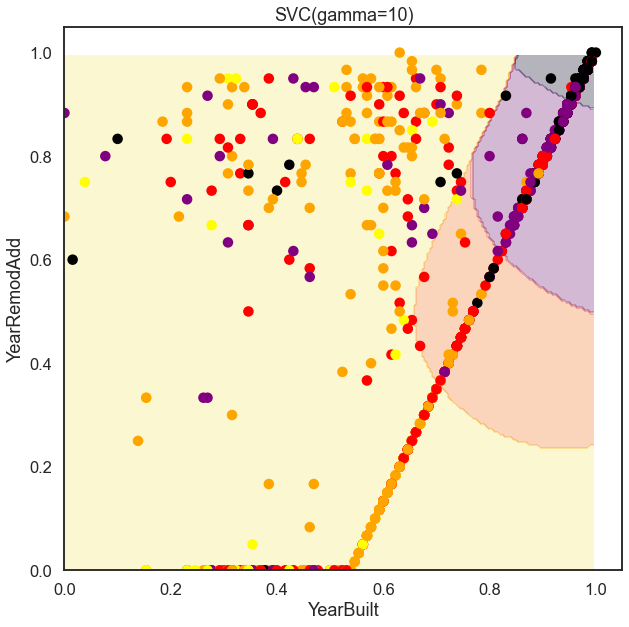

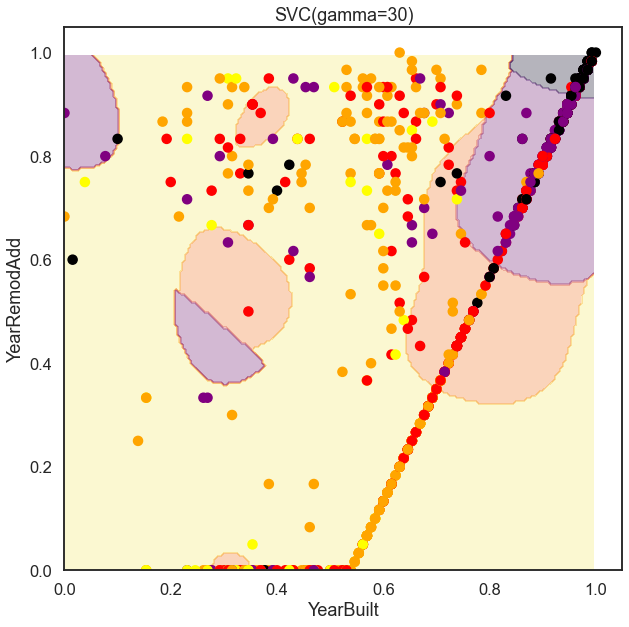

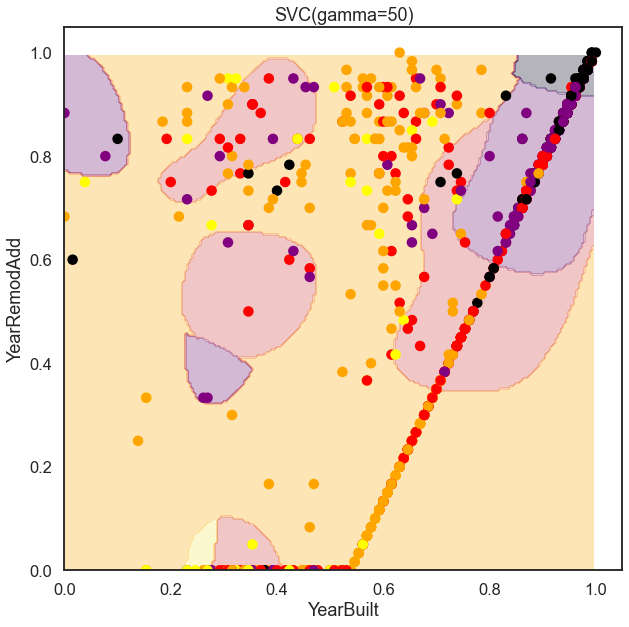

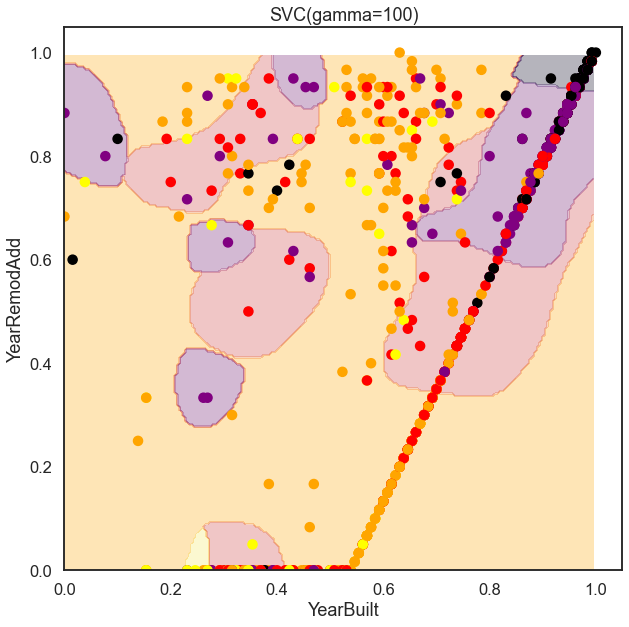

In [54]:
#Kernel Parameter Tunning: gamma <- 10
gammas = [0.5, 1, 2, 10, 30, 50, 100]
for gamma in gammas:
    GaussianSVC_model = SVC(kernel='rbf', gamma=gamma)
    plot_decision_boundary(GaussianSVC_model, X_train_scal_LSVC, y_train_LSVC)

In [56]:
#Using 2 Features Only
GaussianSVC_L2_model = SVC(kernel='rbf', gamma=10, C=2).fit(X_train_scal_LSVC, y_train_LSVC)
y_pred = GaussianSVC_L2_model.predict(X_test_scal_LSVC)

print(classification_report(y_test_LSVC, y_pred))
print('Accuracy score: ', round(accuracy_score(y_test_LSVC, y_pred), 2))
print('F1 Score: ', round(f1_score(y_test_LSVC, y_pred, average='weighted'), 2))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        32
           1       0.46      0.82      0.59       110
           2       0.48      0.20      0.28       109
           3       0.51      0.53      0.52        95
           4       0.47      0.53      0.50        68

    accuracy                           0.48       414
   macro avg       0.39      0.42      0.38       414
weighted avg       0.44      0.48      0.43       414

Accuracy score:  0.48
F1 Score:  0.43


/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result)

In [57]:
#Using all 79 features - overly complicated, gamma/c need retuned
GaussianSVC_L2_model2 = SVC(kernel='rbf', gamma=10, C=2).fit(X_train_scal, y_train)
y_pred = GaussianSVC_L2_model2.predict(X_test_scal)

print(classification_report(y_test, y_pred))
print('Accuracy score: ', round(accuracy_score(y_test, y_pred), 2))
print('F1 Score: ', round(f1_score(y_test, y_pred, average='weighted'), 2))

              precision    recall  f1-score   support

           0       1.00      0.03      0.06        32
           1       0.33      0.99      0.49       110
           2       0.53      0.09      0.16       109
           3       0.73      0.32      0.44        95
           4       0.52      0.16      0.25        68

    accuracy                           0.39       414
   macro avg       0.62      0.32      0.28       414
weighted avg       0.56      0.39      0.32       414

Accuracy score:  0.39
F1 Score:  0.32


In [58]:
#Decision Tree Models

In [59]:
#Baseline Decision Tree Model
DecisionTree_model = DecisionTreeClassifier(random_state=416).fit(X_train, y_train)
DecisionTree_model.tree_.node_count, DecisionTree_model.tree_.max_depth

(823, 28)

In [60]:
def measure_error(y_true, y_pred, label):
    return pd.Series({'Accuracy': accuracy_score(y_true, y_pred),
                      'Precision': precision_score(y_true, y_pred, average='weighted'),
                      'Recall': recall_score(y_true, y_pred, average='weighted'),
                      'F1 Score': f1_score(y_true, y_pred, average='weighted')},
                      name = label)

In [61]:
y_train_pred = DecisionTree_model.predict(X_train)
y_test_pred = DecisionTree_model.predict(X_test)

traintest_error = pd.concat([measure_error(y_train, y_train_pred, 'Train'),
                             measure_error(y_test, y_test_pred, 'Test')],
                             axis = 1)
traintest_error

,Train,Test
Accuracy,0.993782,0.466184
Precision,0.993835,0.468250
Recall,0.993782,0.466184
F1 Score,0.993785,0.466883


In [62]:
#Using Grid Search with Cross Validation, Find Decision Tree Generalize well on TestSet
param_grid = {'max_depth': range(1, DecisionTree_model.tree_.max_depth+1, 2),
              'max_features': range(1, len(DecisionTree_model.feature_importances_)+1)}

GR = GridSearchCV(DecisionTreeClassifier(random_state=416),
                  param_grid=param_grid, scoring='accuracy', n_jobs=-1)

DecisionTree_GR = GR.fit(X_train, y_train)

In [63]:
DecisionTree_GR.best_estimator_.tree_.node_count, DecisionTree_GR.best_estimator_.tree_.max_depth

(59, 5)

In [64]:
y_train_pred_GR = DecisionTree_GR.predict(X_train)
y_test_pred_GR = DecisionTree_GR.predict(X_test)

traintest_error_GR = pd.concat([measure_error(y_train, y_train_pred_GR, 'Train'),
                                measure_error(y_test, y_test_pred_GR, 'Test')],
                                axis = 1)
traintest_error_GR

,Train,Test
Accuracy,0.603109,0.502415
Precision,0.612865,0.482235
Recall,0.603109,0.502415
F1 Score,0.584648,0.471909


In [65]:
#Regression Tree Model
RegressionTree_model = DecisionTreeRegressor().fit(X_train, y_train)

param_grid = {'max_depth': range(1, RegressionTree_model.tree_.max_depth+1, 2),
              'max_features': range(1, len(RegressionTree_model.feature_importances_)+1)}

GR = GridSearchCV(DecisionTreeRegressor(random_state=416),
                  param_grid=param_grid,
                  scoring='neg_mean_squared_error',
                  n_jobs=-1)
RegressionTree_GR = GR.fit(X_train, y_train)

In [66]:
RegressionTree_GR.best_estimator_.tree_.node_count, RegressionTree_GR.best_estimator_.tree_.max_depth

(53, 5)

In [67]:
y_train_pred_GR = RegressionTree_GR.predict(X_train)
y_test_pred_GR = RegressionTree_GR.predict(X_test)

traintest_error_GR = pd.Series({'Train': mean_squared_error(y_train, y_train_pred_GR),
                                'Test': mean_squared_error(y_test, y_test_pred_GR)},
                                name = 'MSE').to_frame().T
traintest_error_GR

,Train,Test
MSE,0.464545,0.631991


[Text(0.5, 0, 'Actual'), Text(0, 0.5, 'Prediction'), (-1.0, 5.0), (-1.0, 5.0)]

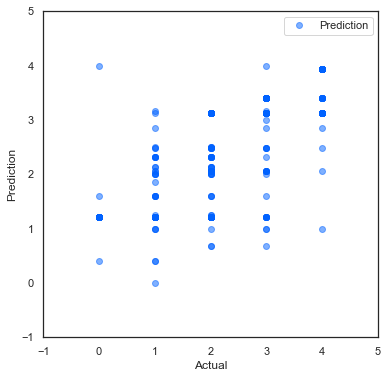

In [68]:
sns.set_context('notebook')
sns.set_style('white')
fig = plt.figure(figsize=(6,6))
ax = plt.axes()

traintest_vald = pd.DataFrame({'Actual': y_test.values,
                               'Prediction': y_test_pred_GR}).set_index('Actual').sort_index()

traintest_vald.plot(marker='o', ls='', ax=ax, alpha=0.5)
ax.set(xlabel='Actual', ylabel='Prediction', xlim=(-1,5), ylim=(-1,5))

In [84]:
#Plot Trees
def plot_tree(estimator, image_name):
    dot_data = StringIO()
    
    export_graphviz(estimator, out_file=dot_data, 
                    feature_names = X_modeldata.columns,
                    filled=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    
    filename = image_name
    graph.write_png(filename)
    return Image(filename=filename)

In [85]:
plot_tree(DecisionTree_model, 'DecisionTree_model.png')

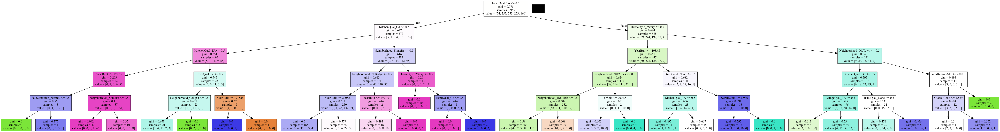

In [86]:
plot_tree(DecisionTree_GR.best_estimator_, 'DecisiontTree_GR_model.png')

In [87]:
plot_tree(RegressionTree_model, 'RegressionTree_model.png')

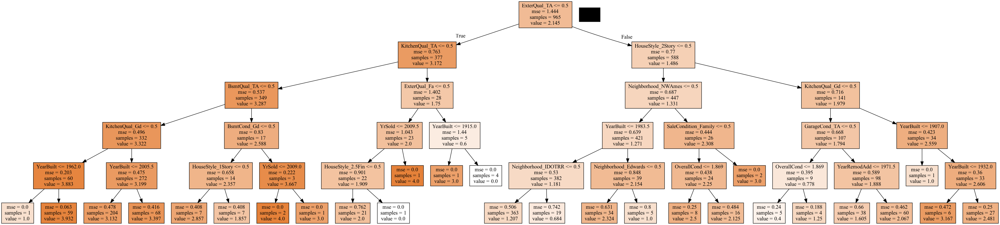

In [88]:
plot_tree(RegressionTree_GR.best_estimator_, 'RegressionTree_GR_model.png')

In [70]:
#Tree Ensemble Models

<AxesSubplot:>

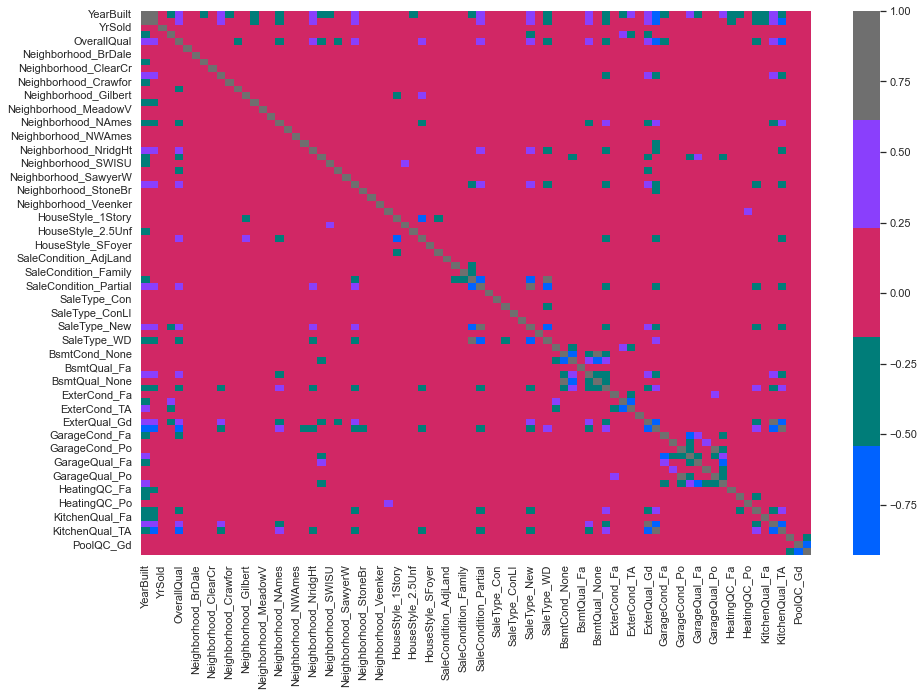

In [91]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(modeldata.corr(), cmap=colors)

<AxesSubplot:>

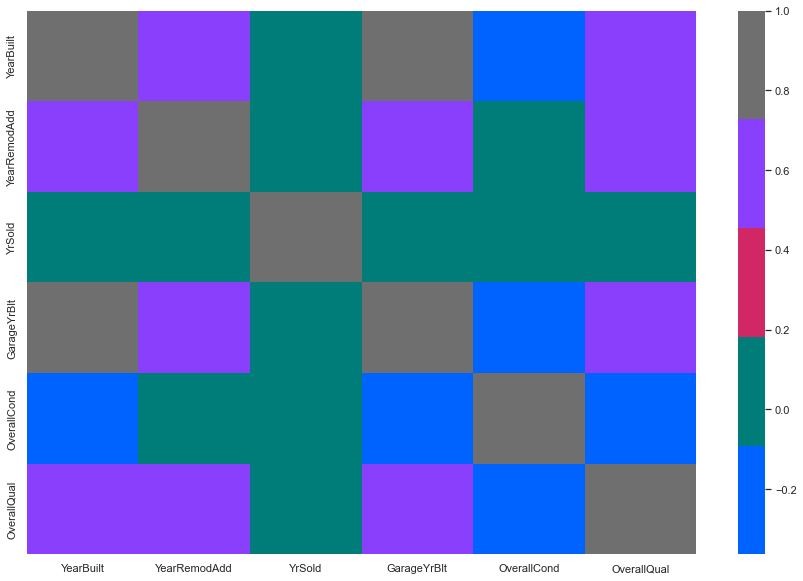

In [92]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(expdata.corr(), cmap=colors)

In [96]:
#Random Forest and Out-of-Bag Error
RandomForest_model = RandomForestClassifier(oob_score=True, random_state=416, warm_start=True, n_jobs=-1)

OOB_list = list()

#Iterate through all possibilities for #trees
for n_trees in [10, 15, 20, 30, 40, 50, 100, 150, 200, 300, 500]:
    RandomForest_model.set_params(n_estimators=n_trees)
    RandomForest_model.fit(X_train, y_train)
    
    OOB_error = 1 - RandomForest_model.oob_score_
    OOB_list.append(pd.Series({'#Trees': n_trees, 'OOB Error': OOB_error}))
    
RandomForest_OOB = pd.concat(OOB_list, axis=1).T.set_index('#Trees')
RandomForest_OOB #50 trees seems best

/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:541: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:545: RuntimeWarning: invalid value encountered in true_divide
  decision = (predictions[k] /
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:541: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:545: RuntimeWarning: invalid value encountered in true_divide
  decision = (predictions[k] /


,OOB Error
#Trees,
10.0,0.547150
15.0,0.519171
20.0,0.507772
30.0,0.497409
40.0,0.484974
50.0,0.461140
100.0,0.468394
150.0,0.466321
200.0,0.460104


[Text(0, 0.5, 'out-of-bag error')]

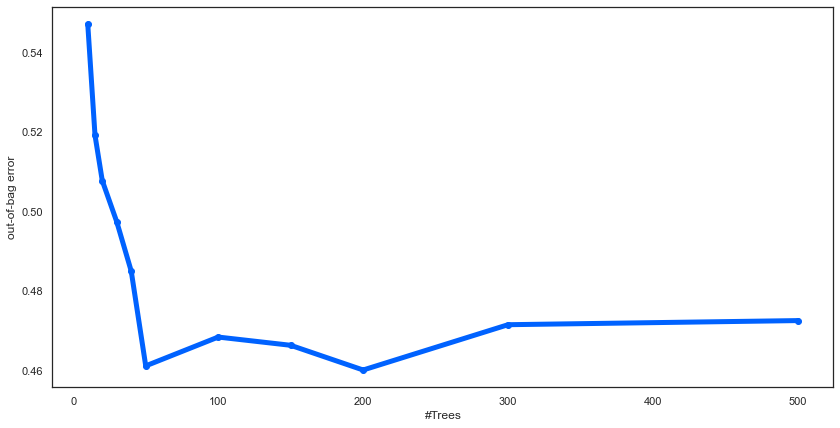

In [97]:
ax = RandomForest_OOB.plot(legend=False, marker='o', figsize=(14,7), linewidth=5)
ax.set(ylabel='out-of-bag error')

In [111]:
#Extra Random Trees
ExtraTrees_model = ExtraTreesClassifier(oob_score=True, random_state=416, warm_start=True, bootstrap=True, n_jobs=-1)

OOB_list = list()

#Iterate through all possibilities for #trees
for n_trees in [10, 15, 20, 30, 40, 50, 100, 150, 200, 300, 500]:
    ExtraTrees_model.set_params(n_estimators=n_trees)
    ExtraTrees_model.fit(X_train, y_train)
    
    OOB_error = 1 - ExtraTrees_model.oob_score_
    OOB_list.append(pd.Series({'#Trees': n_trees, 'OOB Error': OOB_error}))

ExtraTrees_OOB = pd.concat(OOB_list, axis=1).T.set_index('#Trees')
ExtraTrees_OOB

/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:541: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:545: RuntimeWarning: invalid value encountered in true_divide
  decision = (predictions[k] /
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:541: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:545: RuntimeWarning: invalid value encountered in true_divide
  decision = (predictions[k] /


,OOB Error
#Trees,
10.0,0.515026
15.0,0.503627
20.0,0.490155
30.0,0.496373
40.0,0.484974
50.0,0.490155
100.0,0.466321
150.0,0.446632
200.0,0.463212


In [112]:
#Combine OOB Errors for Random Forest & Extra Trees
OOB_df = pd.concat([RandomForest_OOB.rename(columns={'OOB Error': 'Random Forest'}),
                    ExtraTrees_OOB.rename(columns={'OOB Error': 'Extra Trees'})], axis=1)
OOB_df

,Random Forest,Extra Trees
#Trees,,
10.0,0.547150,0.515026
15.0,0.519171,0.503627
20.0,0.507772,0.490155
30.0,0.497409,0.496373
40.0,0.484974,0.484974
50.0,0.461140,0.490155
100.0,0.468394,0.466321
150.0,0.466321,0.446632
200.0,0.460104,0.463212


[Text(0, 0.5, 'out-of-bag error')]

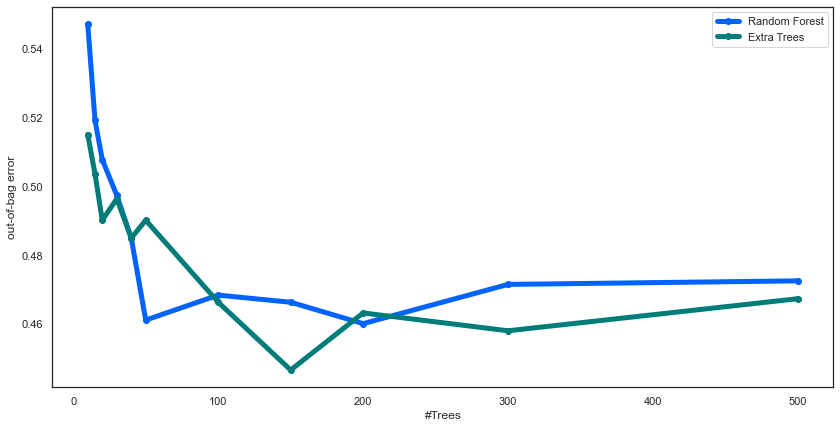

In [113]:
ax = OOB_df.plot(marker='o', figsize=(14,7), linewidth=5)
ax.set(ylabel='out-of-bag error')
#Extra trees model with 150 trees performs best

In [115]:
RandomForest_model = RandomForestClassifier(oob_score=True, random_state=416, warm_start=True, n_jobs=-1)
RandomForest_model.set_params(n_estimators=50)
RandomForest_model.fit(X_train, y_train)

y_pred_RF = RandomForest_model.predict(X_test)

vald_results = classification_report(y_test, y_pred_RF)
print(vald_results)

              precision    recall  f1-score   support

           0       0.69      0.28      0.40        32
           1       0.53      0.65      0.58       110
           2       0.49      0.49      0.49       109
           3       0.53      0.53      0.53        95
           4       0.68      0.65      0.66        68

    accuracy                           0.55       414
   macro avg       0.58      0.52      0.53       414
weighted avg       0.56      0.55      0.54       414



In [116]:
ExtraTrees_model = ExtraTreesClassifier(oob_score=True, random_state=416, warm_start=True, bootstrap=True, n_jobs=-1)
ExtraTrees_model.set_params(n_estimators=150)
ExtraTrees_model.fit(X_train, y_train)

y_pred_ET = ExtraTrees_model.predict(X_test)

vald_results = classification_report(y_test, y_pred_ET)
print(vald_results)

              precision    recall  f1-score   support

           0       0.71      0.31      0.43        32
           1       0.55      0.60      0.57       110
           2       0.43      0.47      0.45       109
           3       0.55      0.54      0.55        95
           4       0.69      0.69      0.69        68

    accuracy                           0.54       414
   macro avg       0.59      0.52      0.54       414
weighted avg       0.55      0.54      0.54       414



Text(0.5, 12.5, 'Actual')

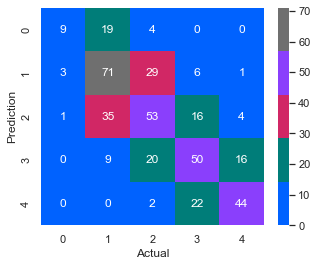

In [127]:
#Display Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_RF)
_, ax = plt.subplots(figsize=(5,4))
ax = sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=colors)

ax.set_ylabel('Prediction')
ax.set_xlabel('Actual')

Text(0.5, 12.5, 'Actual')

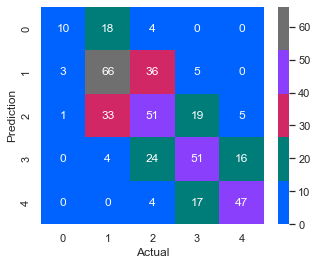

In [128]:
conf_matrix = confusion_matrix(y_test, y_pred_ET)
_, ax = plt.subplots(figsize=(5,4))
ax = sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=colors)

ax.set_ylabel('Prediction')
ax.set_xlabel('Actual')

[Text(0, 0.5, 'Relative Importance'), Text(0.5, 0, 'Feature')]

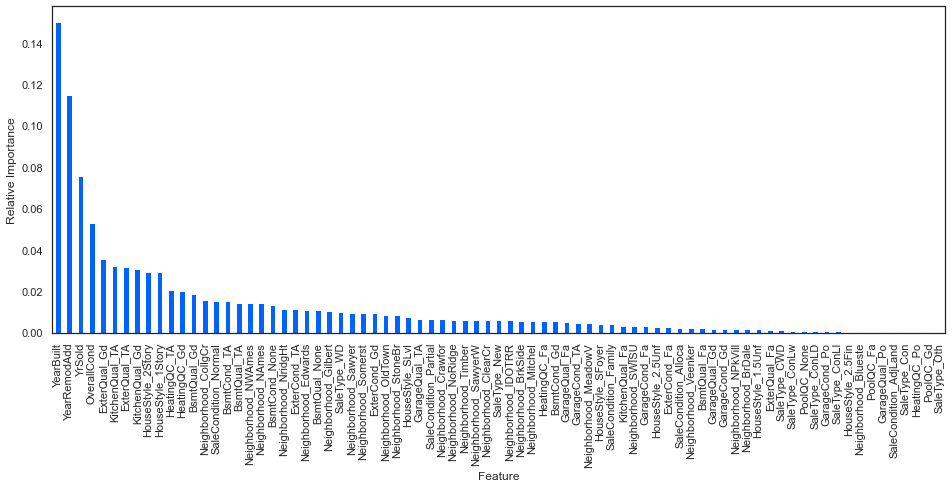

In [131]:
#Plot Feature Importances
feature_imp = pd.Series(RandomForest_model.feature_importances_, index=X_modeldata.columns).sort_values(ascending=False)

ax = feature_imp.plot(kind='bar', figsize=(16,6))
ax.set(ylabel='Relative Importance',xlabel='Feature')

[Text(0, 0.5, 'Relative Importance'), Text(0.5, 0, 'Feature')]

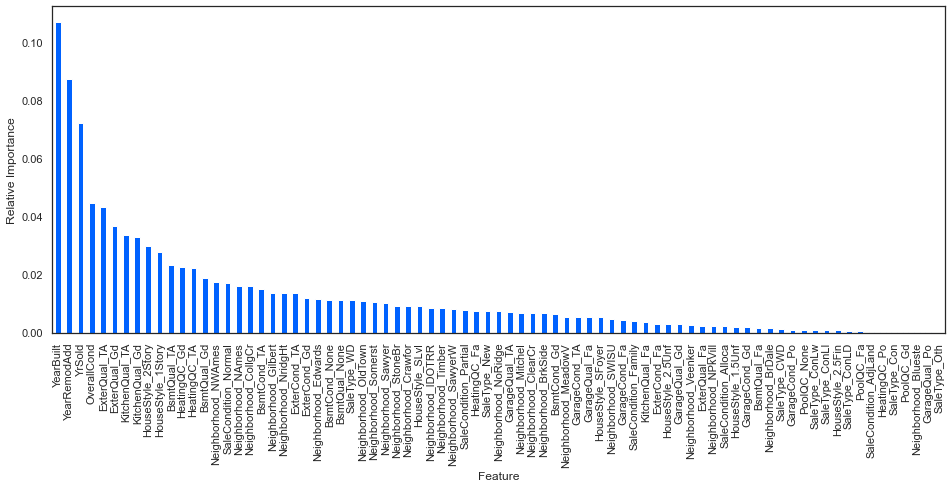

In [132]:
feature_imp = pd.Series(ExtraTrees_model.feature_importances_, index=X_modeldata.columns).sort_values(ascending=False)

ax = feature_imp.plot(kind='bar', figsize=(16,6))
ax.set(ylabel='Relative Importance',xlabel='Feature')

In [133]:
#Error: Multi-class NOT supported!!
#Plot ROC & Precision-Recall Curves
def plot_roc_pr_curves(model):
    fig, axList = plt.subplots(ncols=2)
    fig.set_size_inches(16,8)
    
    y_prob = model.predict_proba(X_test)
    
    #plot ROC curve
    ax = axList[0]
    
    fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])
    ax.plot(fpr, tpr, color=colors[0], linewidth=5)    
    #customary to draw a diagonal dotted line to indicate random prediction
    ax.plot([0,1],[0,1], ls='--', color='black', lw=.3)
    ax.set(xlabel='False Positive Rate (1 - Specificity)',
           ylabel='True Positive Rate (Sensitivity)',
           xlim=[-0.01, 1.01], ylim=[-0.01, 1.01],
           title='ROC Curve')
    ax.grid(True)
    
    #plot Precision-Recall curve
    ax = axList[1]
    
    precision, recall, _ = precision_recall_curve(y_test, y_prob[:,1])
    ax.plot(recall, precision, color=colors[1], linewidth=5)
    ax.set(xlabel='Recall', ylabel='Precision',
           xlim=[-0.01, 1.01], ylim=[-0.01, 1.01],
           title='Precision-Recall Curve')
    ax.grid(True)

plt.tight_layout()

<Figure size 432x288 with 0 Axes>

In [135]:
#Boosting
modeldata['OverallQual'].unique()

array([3, 2, 4, 1, 0])

In [139]:
#Gradient Boost Model
error_list = list()

#iterate through various possibilities for #trees
for n_trees in [10, 15, 20, 30, 40, 50, 100, 150, 200, 300, 500]:
    GradientBoost_model = GradientBoostingClassifier(n_estimators=n_trees, random_state=416)
    GradientBoost_model.fit(X_train, y_train)
    
    y_pred = GradientBoost_model.predict(X_test)
    error = 1 - accuracy_score(y_test, y_pred)
    error_list.append(pd.Series({'#Trees': n_trees, 'Error': error}))
    
error_results = pd.concat(error_list, axis=1).T.set_index('#Trees')
error_results

,Error
#Trees,
10.0,0.458937
15.0,0.429952
20.0,0.420290
30.0,0.422705
40.0,0.422705
50.0,0.429952
100.0,0.456522
150.0,0.468599
200.0,0.466184


(0.0, 550.0)

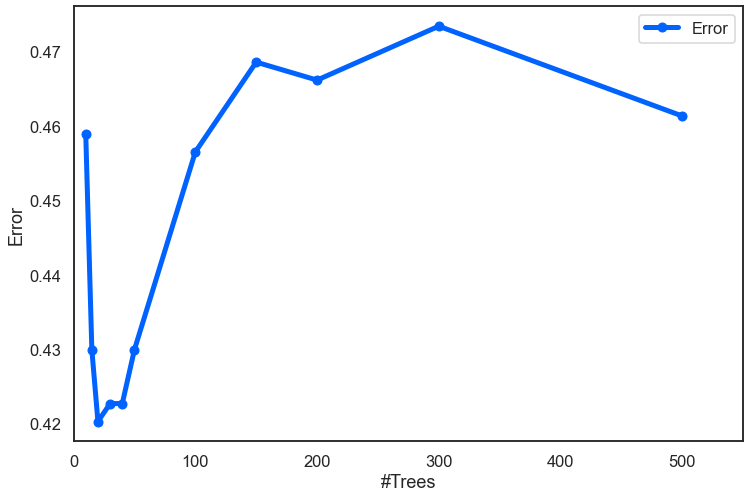

In [140]:
sns.set_context('talk')
sns.set_style('white')
sns.set_palette(palette)

ax = error_results.plot(marker='o', figsize=(12,8), linewidth=5)
ax.set(xlabel='#Trees', ylabel='Error')
ax.set_xlim(0, max(error_results.index)*1.1)

In [141]:
#Use Grid Search with Cross-Validation for Gradient Boosted Classifier
param_grid = {'n_estimators': [10, 15, 20, 30, 40, 50, 100, 150, 200, 300, 500],
              'learning_rate': [0.1, 0.01, 0.001, 0.0001],
              'subsample': [1, 0.5],
              'max_features': [1, 2, 3, 4]}

GR = GridSearchCV(GradientBoostingClassifier(random_state=416),
                  param_grid=param_grid,
                  scoring='accuracy',
                  n_jobs=-1)
GradientBoost_GR = GR.fit(X_train, y_train)

In [142]:
GradientBoost_GR.best_estimator_

GradientBoostingClassifier(max_features=4, random_state=416, subsample=0.5)

In [143]:
y_pred = GradientBoost_GR.predict(X_test)
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.25      0.50      0.33        16
           1       0.71      0.55      0.62       143
           2       0.43      0.52      0.47        91
           3       0.64      0.56      0.60       108
           4       0.65      0.79      0.71        56

    accuracy                           0.57       414
   macro avg       0.54      0.58      0.55       414
weighted avg       0.60      0.57      0.58       414



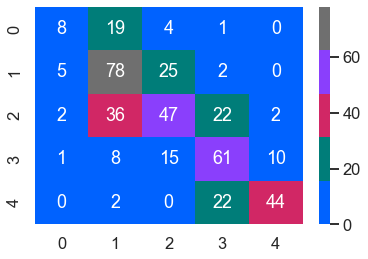

In [144]:
sns.set_context('talk')
conf_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=colors)

In [147]:
#Adaptive Boost Model
AdaptiveBoost_model = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1))

param_grid = {'n_estimators': [10, 15, 20, 30, 40, 50, 100, 150, 200, 300, 500],
              'learning_rate': [0.1, 0.01, 0.001, 0.0001]}

GR = GridSearchCV(AdaptiveBoost_model,
                                param_grid=param_grid,
                                scoring='accuracy',
                                n_jobs=-1)
AdaptiveBoost_GR = GR.fit(X_train, y_train)

In [148]:
AdaptiveBoost_GR.best_estimator_

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1),
                   learning_rate=0.1, n_estimators=100)

In [149]:
y_pred = AdaptiveBoost_GR.predict(X_test)
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.06      0.40      0.11         5
           1       0.69      0.49      0.57       156
           2       0.39      0.46      0.42        91
           3       0.37      0.42      0.39        84
           4       0.46      0.40      0.42        78

    accuracy                           0.45       414
   macro avg       0.39      0.43      0.38       414
weighted avg       0.51      0.45      0.47       414



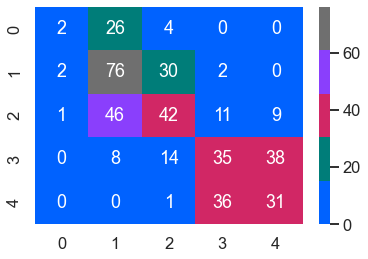

In [150]:
sns.set_context('talk')
conf_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=colors)

In [153]:
#Logistic Regression Model
LR_L2 = LogisticRegression(penalty='l2', max_iter=500, solver='saga').fit(X_train_scal, y_train)

y_pred = LR_L2.predict(X_test_scal)
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.34      0.55      0.42        20
           1       0.65      0.56      0.61       128
           2       0.39      0.46      0.42        94
           3       0.63      0.56      0.59       107
           4       0.71      0.74      0.72        65

    accuracy                           0.57       414
   macro avg       0.55      0.57      0.55       414
weighted avg       0.58      0.57      0.57       414



/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


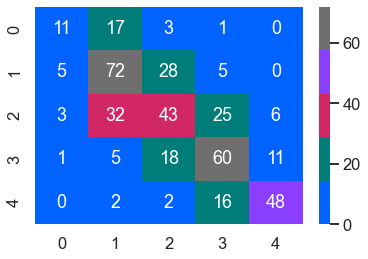

In [154]:
sns.set_context('talk')
conf_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=colors)

In [164]:
#Stacked Model - Distance-Based Classifiers
distance_estimators = [('Logistic Regression Model', LogisticR_model),
                       ('L1 Logistic Regression Model', LogisticR_L1_model),
                       ('L2 Logistic Regression Model', LogisticR_L2_model),
                       ('K Nearest Neighbors Model', KNN_model),
                       ('L2 Gaussian Support Vector Model', GaussianSVC_L2_model2)]

MetaVote = VotingClassifier(distance_estimators, voting='hard')
MetaVote = MetaVote.fit(X_train_scal, y_train)
y_pred = MetaVote.predict(X_test_scal)
print(classification_report(y_test, y_pred))

/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/lillycorsair/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_b

              precision    recall  f1-score   support

           0       0.32      0.19      0.24        32
           1       0.52      0.80      0.63       110
           2       0.48      0.28      0.36       109
           3       0.54      0.59      0.56        95
           4       0.78      0.66      0.71        68

    accuracy                           0.55       414
   macro avg       0.53      0.50      0.50       414
weighted avg       0.54      0.55      0.53       414



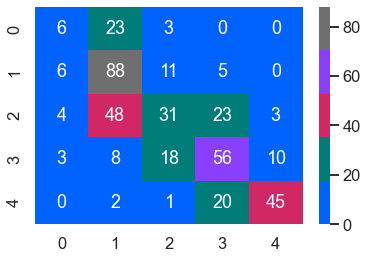

In [165]:
sns.set_context('talk')
conf_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=colors)

In [162]:
#Stacked Model 
tree_estimators = [('Decision Tree Model', DecisionTree_GR),
                   ('Random Forest Model', RandomForest_model),
                   ('Extra Trees Model', ExtraTrees_model),
                   ('Gradient Boost Model', GradientBoost_GR),
                   ('Adaptive Boost Model', AdaptiveBoost_GR)]

MetaVote = VotingClassifier(tree_estimators, voting='soft')
MetaVote = MetaVote.fit(X_train, y_train)
y_pred = MetaVote.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.44      0.12      0.20        32
           1       0.51      0.69      0.59       110
           2       0.51      0.42      0.46       109
           3       0.56      0.65      0.60        95
           4       0.82      0.66      0.73        68

    accuracy                           0.56       414
   macro avg       0.57      0.51      0.52       414
weighted avg       0.57      0.56      0.55       414



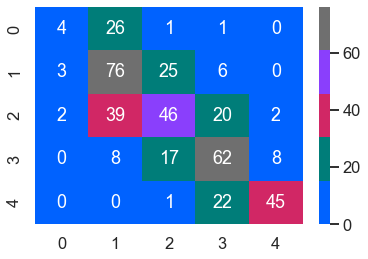

In [163]:
sns.set_context('talk')
conf_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=colors)